In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [3]:
import re
# import gensim.parsing.preprocessing
from gensim.parsing.preprocessing import strip_punctuation, strip_tags, strip_numeric

In [4]:
#from gensim.parsing.preprocessing import strip_punctuation, strip_tags, strip_numeric
import nltk
from nltk.corpus import stopwords

In [5]:
df = pd.read_csv("uber_cleaned.csv")

In [6]:
df.head()

,Unnamed: 0,Title,Rating,Review,Date
0,0,Dishonest and Disgusting,1,"For half an hour, we tried EVERY UBER SERVICE ...",29-12-2020 01:14
1,1,Free offer,2,If I’m not eligible for the offer Stop floodin...,01-01-2021 23:17
2,2,Inaccurate,2,Consistently inaccurate Uber Eats ETA and the ...,15-01-2021 23:38
3,3,sea,1,i had my rides canceled back to back. they the...,08-12-2020 01:01
4,4,Double charged me for an order,1,Two of the same orders was added by accident. ...,15-12-2020 04:02


In [7]:
# need to group based on rating review
# pre-process to remove punctuations, stop words
# create word-cloud

In [8]:
# df.loc[df['Rating']==1,'Review'].to_list()

In [9]:
# rating_1_rev = df.loc[df['Rating']==1,'Review'].to_list()

In [10]:
sw = stopwords.words("english")

In [11]:
def tokenize(text):
    filtered_tokens = []
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent) if word.lower() not in sw]
    
    for token in tokens:
        # keep only alphabets, remove punc, numerical, etc
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    return filtered_tokens

In [12]:
# def tokenize_only(text):
#     ## stop words
#     sw_eng = stopwords.words('english')
#     # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
#     tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent) if word.lower() not in sw_eng]
#     filtered_tokens = []
#     # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
#     for token in tokens:
#         if re.search('[a-zA-Z]', token):
#             filtered_tokens.append(token)
#     return filtered_tokens

In [13]:
# tokenized_text = []
# for i in rev_per_rating[1][0]:
#     # print(i)
#     # print("--------------")
#     tokenized_text.extend(tokenize_only(i))

In [14]:
# tokenized_text

In [42]:
## generates word cloud from data directly
def create_word_cloud(final_data, title ):
    wordcloud = WordCloud(width=1600, height=800, max_font_size=200, 
                          mode='RGBA', background_color='white').generate(final_data)
    # plt the image generated by WordCloud class
    plt.figure(figsize=(12,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title, fontsize = 16)
    plt.show()

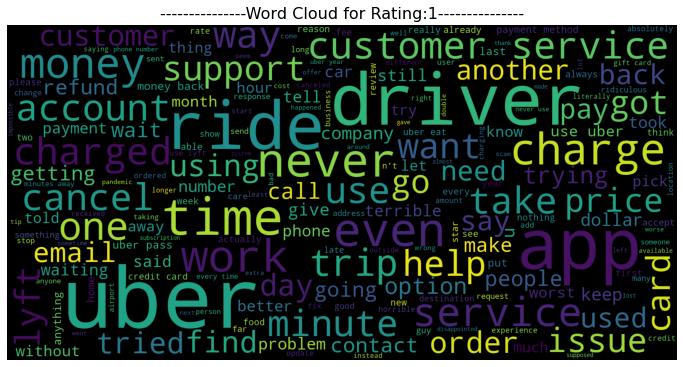

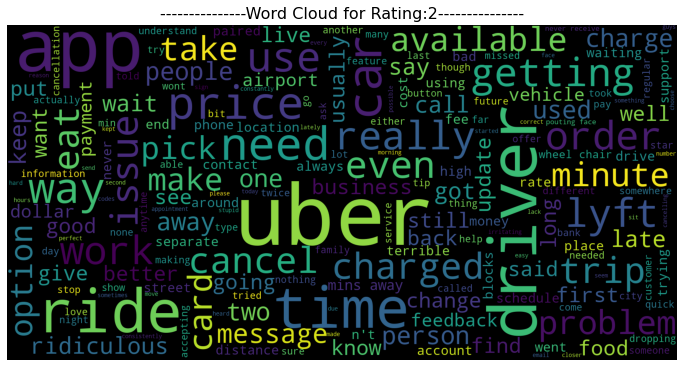

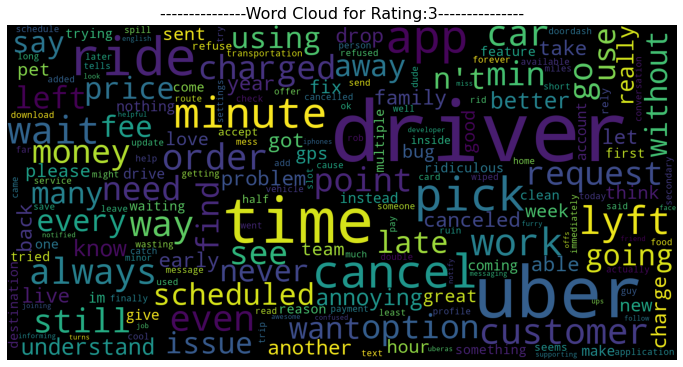

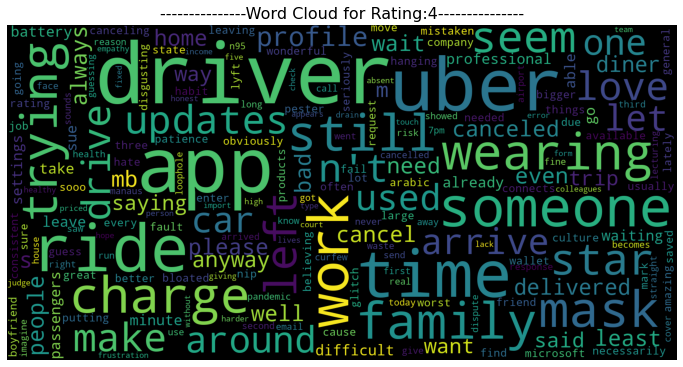

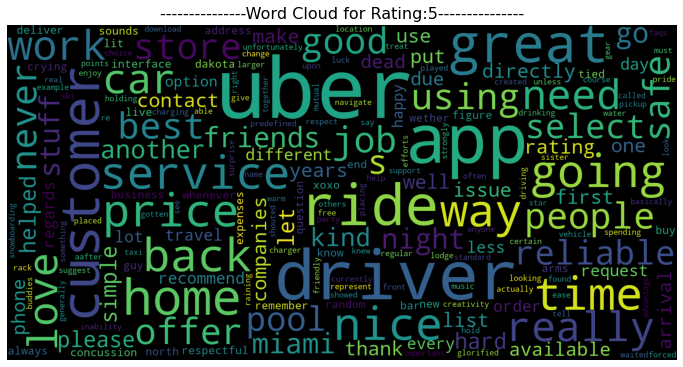

In [41]:
## generate word cloud 
for rating in df['Rating'].sort_values().unique():
    tokens = tokenize(" ".join(df.loc[df['Rating'] == rating, 'Review'].to_list()))
    title = f"---------------Word Cloud for Rating:{rating}---------------"
    create_word_cloud(' '.join(tokens), title)

In [17]:
## vectorizing to create word cloud

In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer

# defining parms for the tf-df-tokenizer here
tfdf_vectorizer = TfidfVectorizer(
    max_features=20000,
    # stop_words=sw,
    use_idf=False, 
    tokenizer=tokenize,
    strip_accents = 'unicode',
    ngram_range=((2,2))
         )

# defining parms for the tf-idf-tokenizer here
tfidf_vectorizer = TfidfVectorizer(
    max_features=20000,
    stop_words=sw,
    use_idf=True, 
    tokenizer=tokenize,
    strip_accents = 'unicode',
    ngram_range=((2,2))
         )

In [19]:
#list to hold the wordcloud object for each rating
tfdf_word_cloud = []
tfidf_word_cloud = []

In [20]:
# tfdf_matrix = tfdf_vectorizer.fit_transform(df.loc[df['Rating'] == 1, 'Review'])
# tfdf_matrix = tfdf_vectorizer.fit_transform(df['Review'])

In [21]:
# tfidf_matrix = tfidf_vectorizer.fit_transform(df['Review'])

In [22]:
# /tfdf_matrix.shape

In [23]:
# tfidf_matrix.shape

In [24]:
# tfdf_vectorizer.vocabulary_.keys()
# tfidf_vectorizer.vocabulary_.keys()

In [25]:
## loop thru rating to create tdm for tfdf & tf-idf
# get weights sum for each term, create word cloud using the word-weight dict
for rating in df['Rating'].sort_values().unique():
    print(f"---------------Word Cloud for Rating:{rating}---------------")
    print(f"---------------Fitting Term Frequency Document Frequency---------------")
    tfdf_matrix = tfdf_vectorizer.fit_transform(df.loc[df['Rating'] == rating, 'Review'].to_list())
    tfdf_weights = [(word,tfdf_matrix.getcol(idx).sum()) for word, idx in tfdf_vectorizer.vocabulary_.items()]
    tfdf_word_cloud.append(
        WordCloud(width=1500, height=1200, mode='RGBA', background_color='white', max_words=500).fit_words(dict(tfdf_weights))
    )
    
    
    print(f"---------------Fitting Term Frequency Inverse Document Frequency---------------")
    tfidf_matrix = tfidf_vectorizer.fit_transform(df.loc[df['Rating'] == rating, 'Review'].to_list())
    tfidf_weights = [(word,tfidf_matrix.getcol(idx).sum()) for word, idx in tfidf_vectorizer.vocabulary_.items()]
    tfidf_word_cloud.append(
        WordCloud(width=1500, height=1200, mode='RGBA', background_color='white', max_words=500).fit_words(dict(tfidf_weights))
    )    

---------------Word Cloud for Rating:1---------------
---------------Fitting Term Frequency Document Frequency---------------
---------------Fitting Term Frequency Inverse Document Frequency---------------


C:\Users\Siddharth Maheshwari\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'re", "'s", "'ve", 'could', 'might', 'must', "n't", 'need', 'sha', 'wo', 'would'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


---------------Word Cloud for Rating:2---------------
---------------Fitting Term Frequency Document Frequency---------------
---------------Fitting Term Frequency Inverse Document Frequency---------------
---------------Word Cloud for Rating:3---------------
---------------Fitting Term Frequency Document Frequency---------------
---------------Fitting Term Frequency Inverse Document Frequency---------------
---------------Word Cloud for Rating:4---------------
---------------Fitting Term Frequency Document Frequency---------------
---------------Fitting Term Frequency Inverse Document Frequency---------------
---------------Word Cloud for Rating:5---------------
---------------Fitting Term Frequency Document Frequency---------------
---------------Fitting Term Frequency Inverse Document Frequency---------------


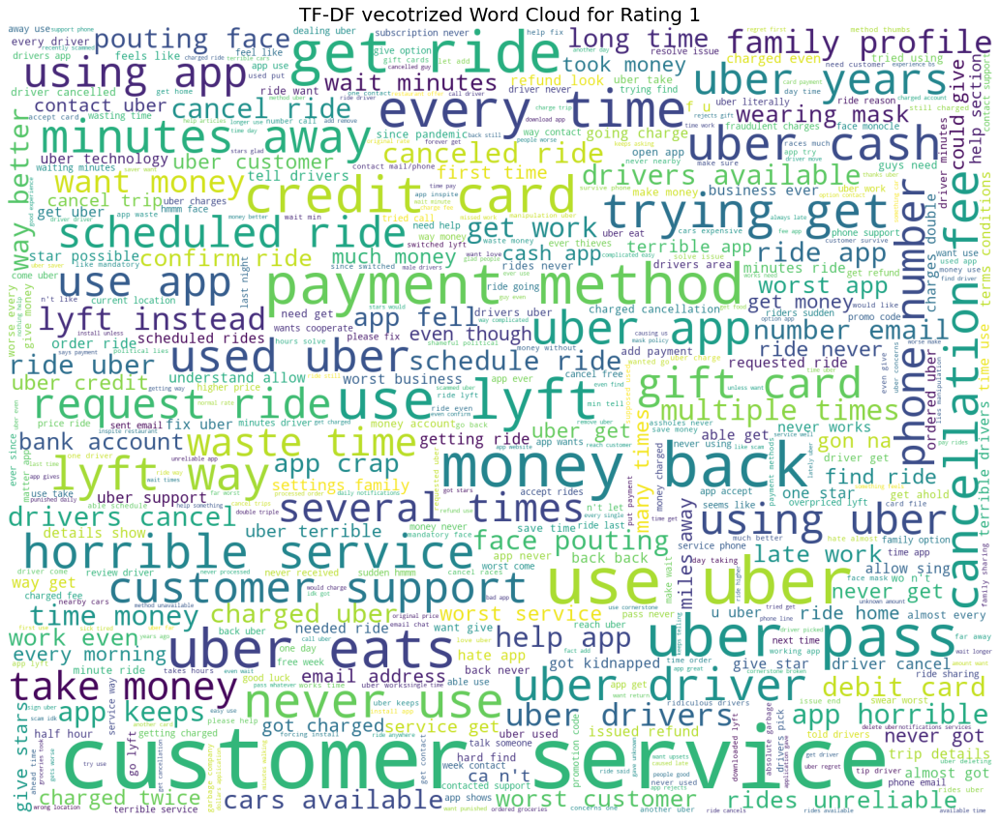

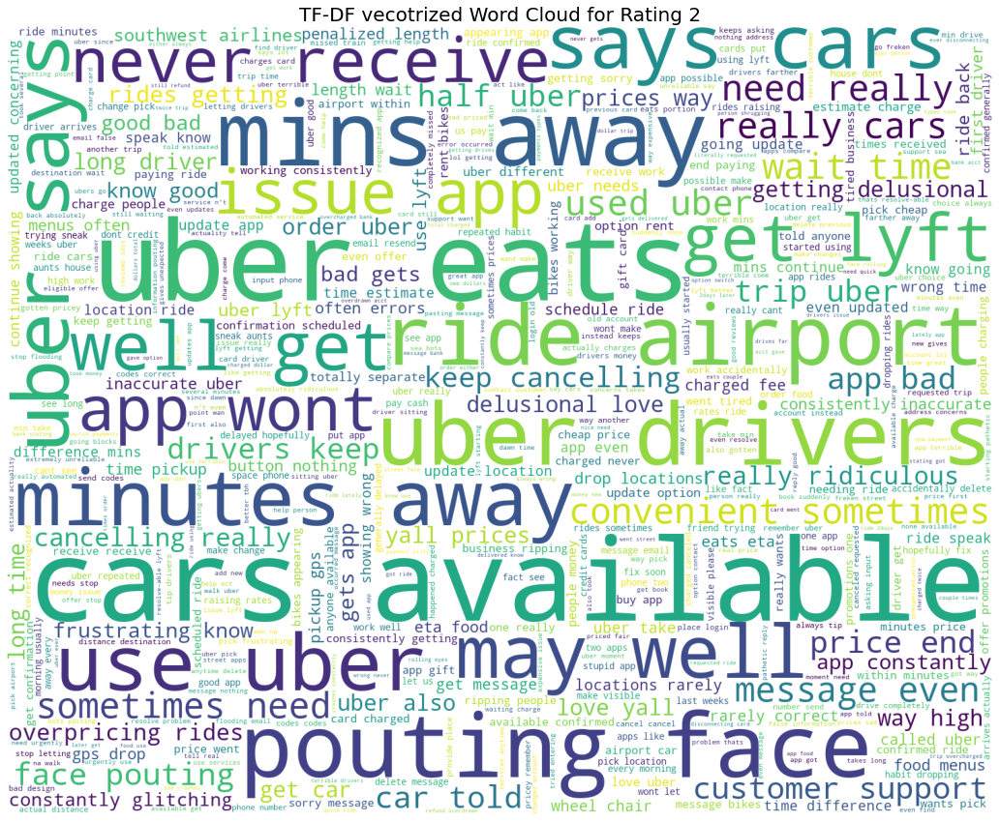

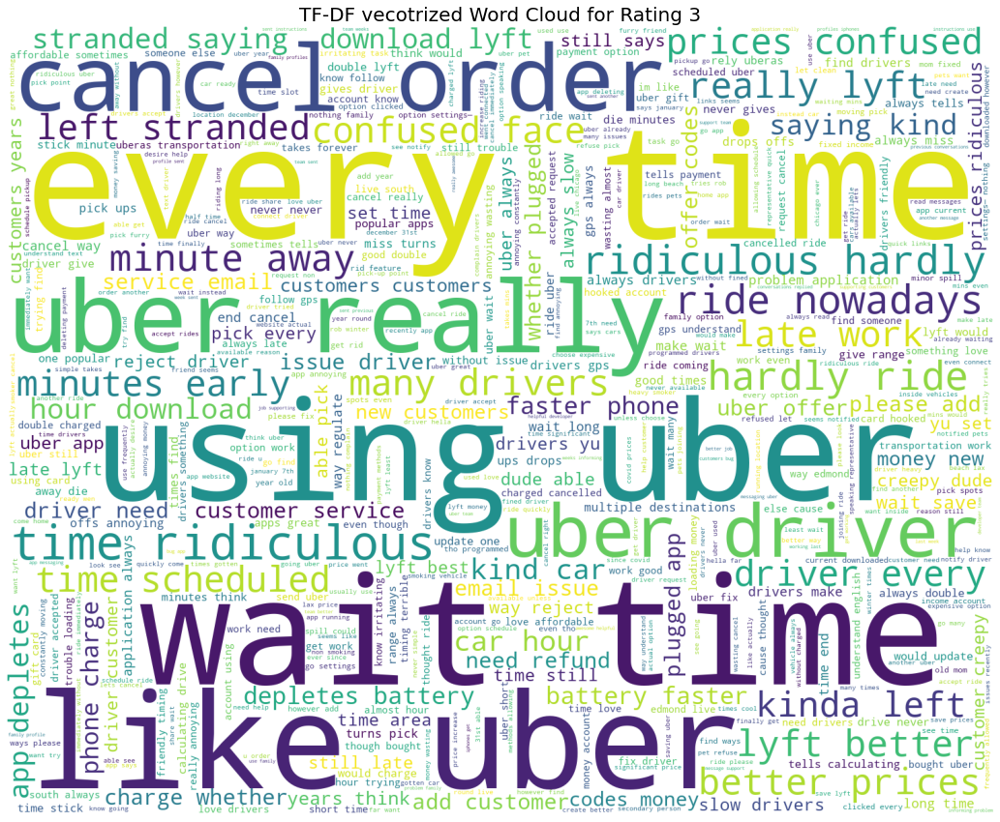

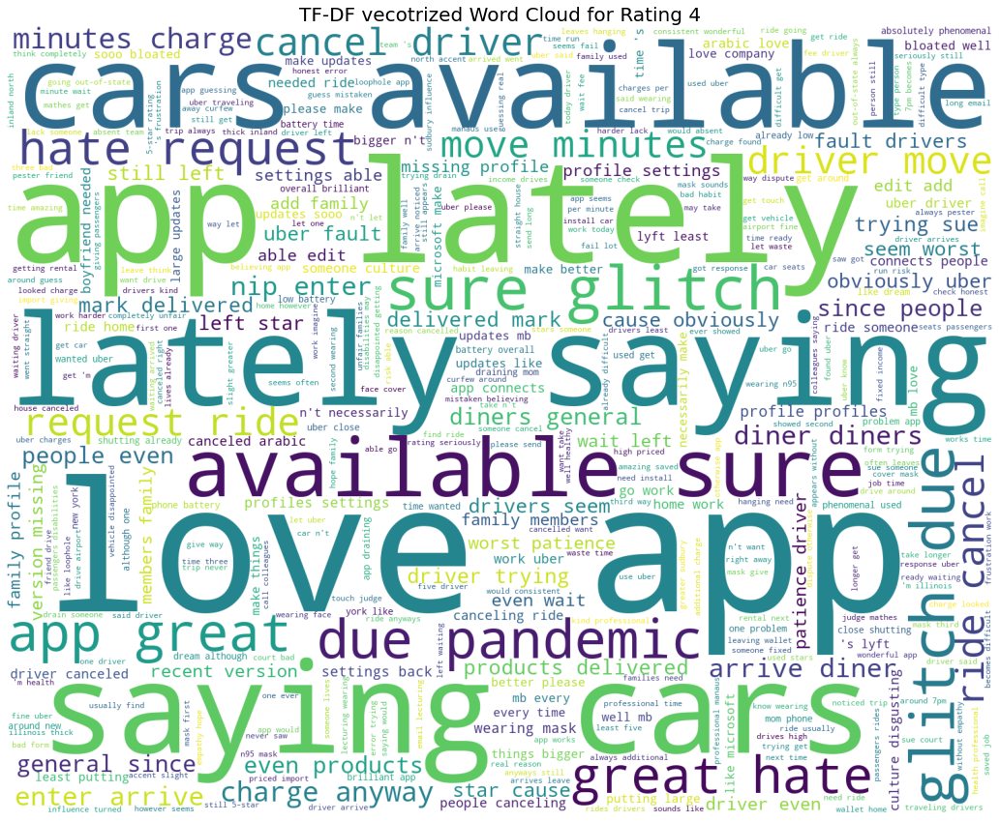

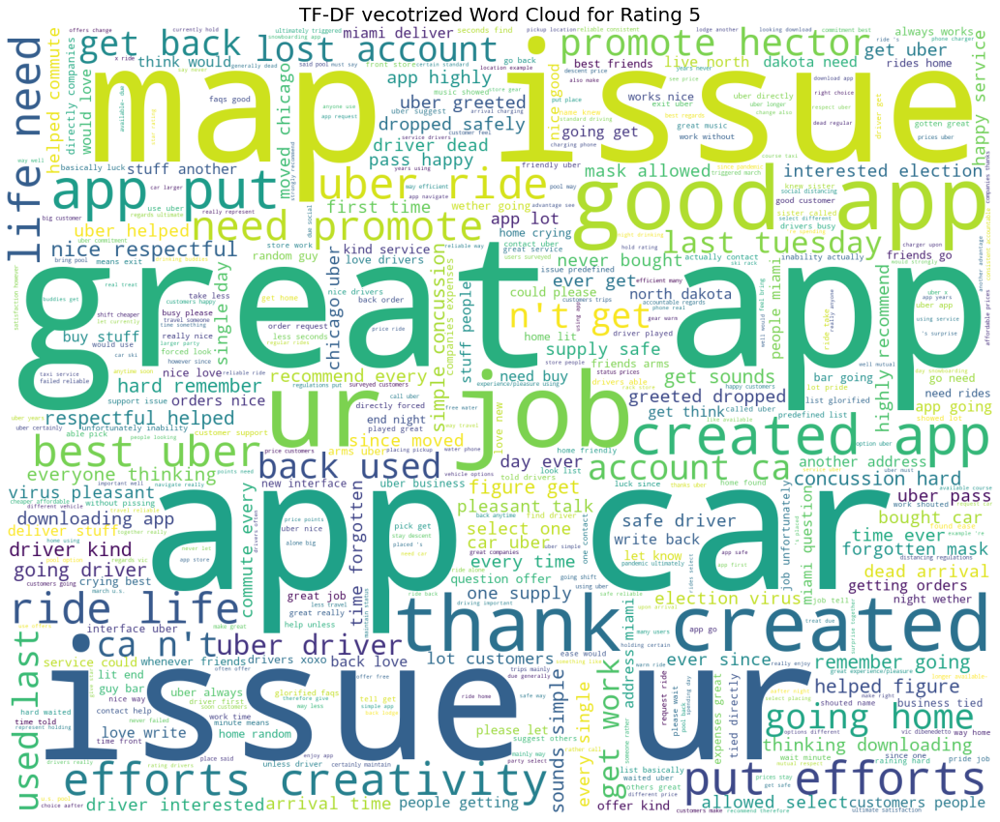

In [26]:
# show word cloud for each rating - tfdf 
for i in range(0,len(tfdf_word_cloud)):
    plt.figure(figsize=(20,15))
    plt.imshow(tfdf_word_cloud[i])
    plt.axis('off')
    plt.title(f"TF-DF vecotrized Word Cloud for Rating {i+1}",fontsize=20)
   

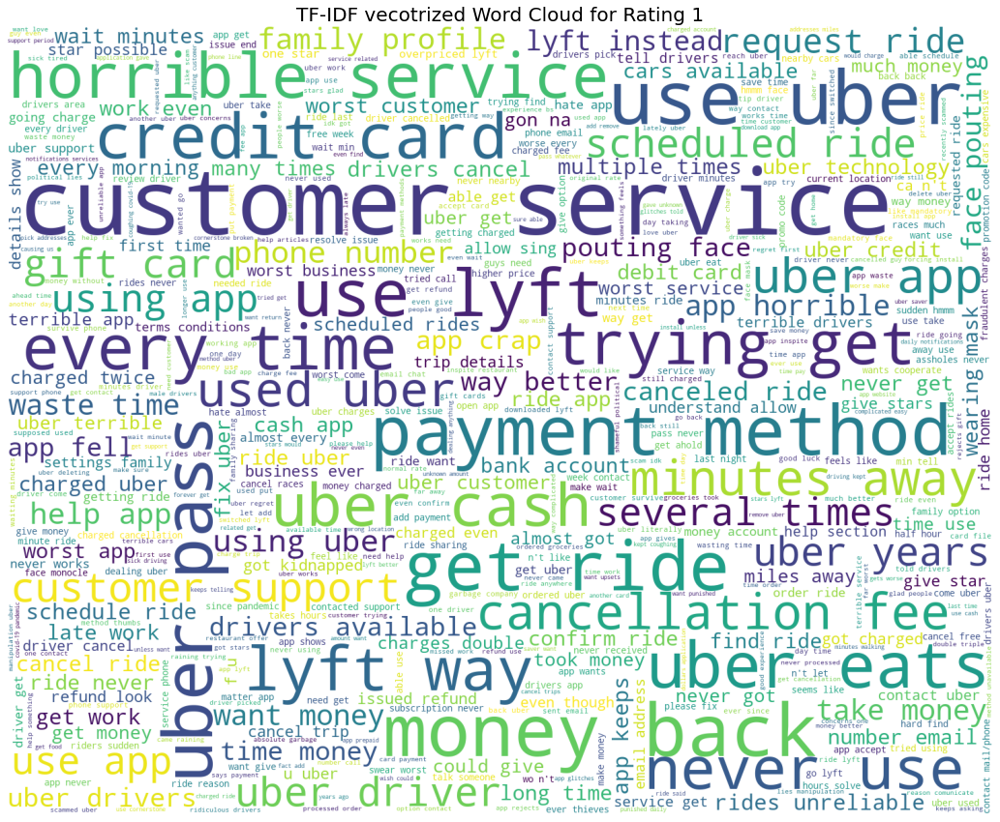

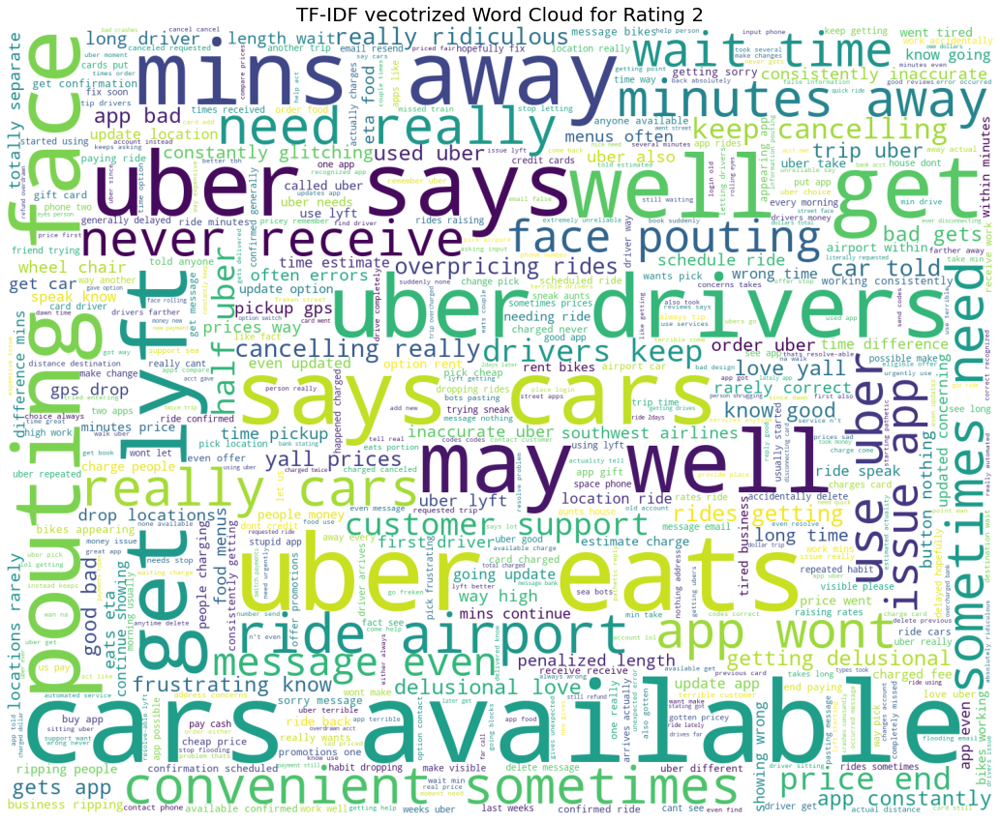

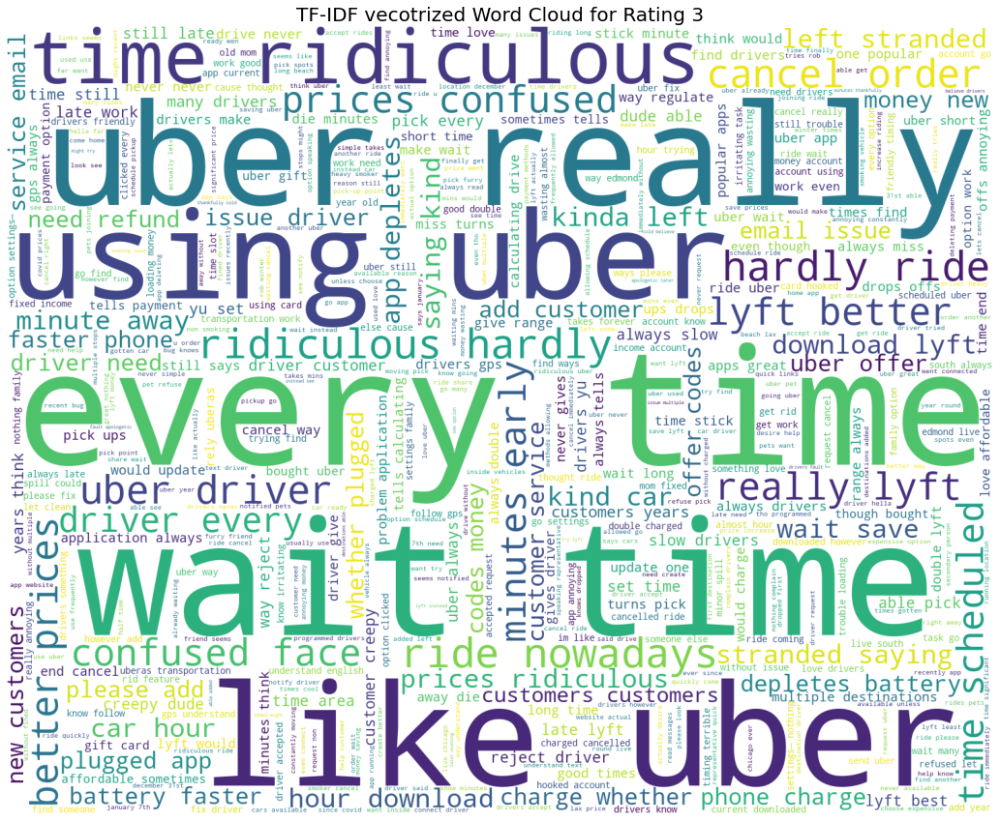

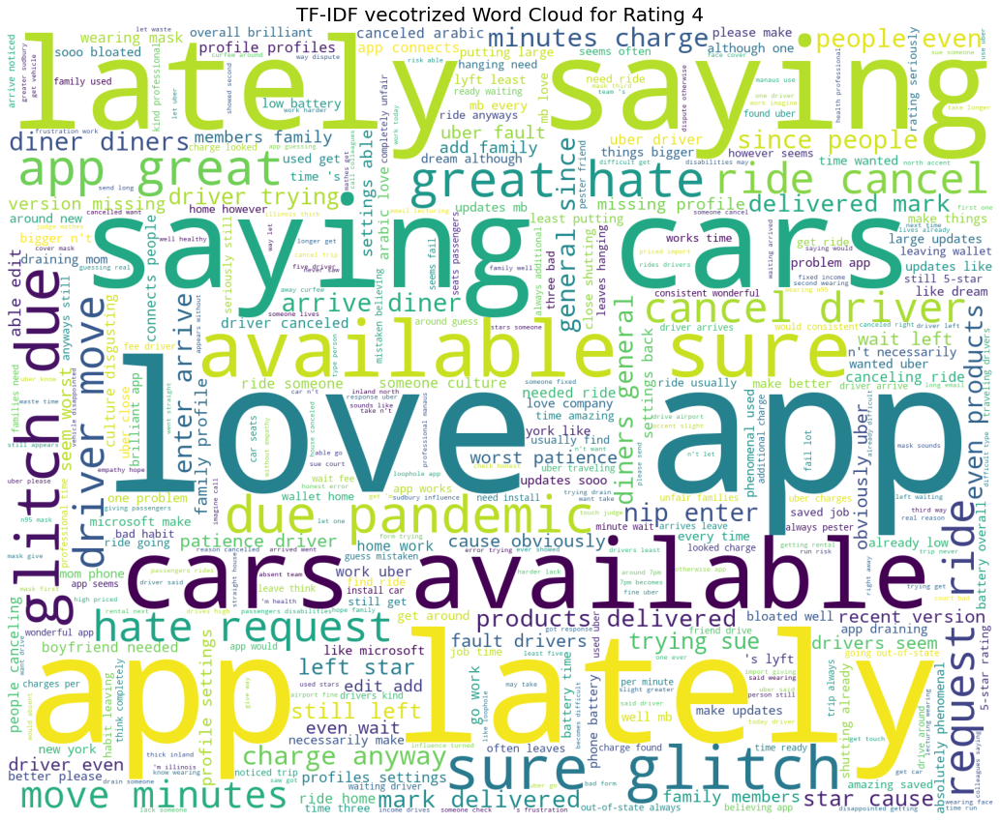

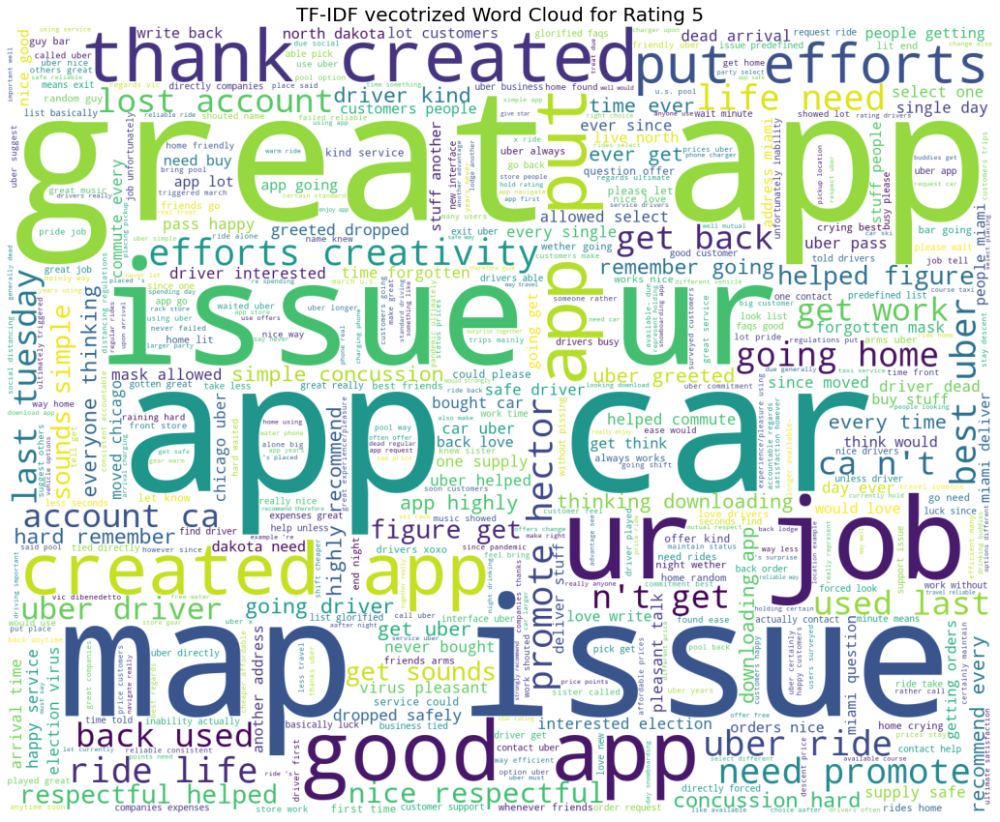

In [27]:
# show word cloud for each rating - tf-idf 
for i in range(0,len(tfidf_word_cloud)):
    plt.figure(figsize=(20,15))
    plt.imshow(tfidf_word_cloud[i])
    plt.axis('off')
    plt.title(f"TF-IDF vecotrized Word Cloud for Rating {i+1}",fontsize=20)
   

In [28]:
# rev_per_rating[2][0]

In [29]:
# # note magic cmd %time
# %time tfdf_matrix = tfdf_vectorizer.fit_transform(rev_per_rating[2][0])    # 6.05 secs

# print(tfdf_matrix.shape)    # dimns of the tfidf matrix

In [30]:
# tfdf_vectorizer.get_feature_names()

In [31]:
# tfdf_vectorizer.vocabulary_.items()

In [32]:
# tfdf_weights = [(word,tfdf_matrix.getcol(idx).sum()) for word, idx in tfdf_vectorizer.vocabulary_.items()]
# tfidf_weights = [(word,tfidf_matrix.getcol(idx).sum()) for word, idx in tfidf_vectorizer.vocabulary_.items()]

In [33]:
# tfidf_weights[:10]

In [34]:
# w = WordCloud(width=1500, height=1200, mode='RGBA', background_color='white', max_words=1000).fit_words(dict(tfidf_weights))

In [35]:
# plt.figure(figsize=(20,15))
# plt.imshow(w)
# plt.axis('off')
# # plt.savefig('recipes_wordcloud.png')